In [123]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Revise
using Interpolations
using Roots
using ColorSchemes
using Colors
using QuadGK
using Integrals
using StaticArrays
using BenchmarkTools
using Profile
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Spinors/rmg_K.jl")
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Lattice_setup/lattice_BZ.jl")
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/patch_methods.jl")
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/rmg_3pV.jl")

# 3D Band Structure

In [94]:
function mBZ_band_structure(Nl, nu, kappa, V, shells)
    k_list = range(-2 * kappa, 2 * kappa, 10^2)
    mBZ_count = num_mBZ(shells)
    energies = Array{Float64}(undef, length(k_list), length(k_list), mBZ_count)
    for i in 1:length(k_list)
        kx = k_list[i]
        for j in 1:length(k_list)
            ky = k_list[j]
            ham = rmg_ham_mBZ_shells([kx, ky], Nl, nu, kappa, V, shells)
            energies[i, j, :] = real.(eigvals(Hermitian(ham)))
        end
    end
    linear_energies = Array{Float64}(undef, length(k_list), length(k_list), mBZ_count)
    for i in 1:length(k_list)
        kx = k_list[i]
        for j in 1:length(k_list)
            ky = k_list[j]
            ham = rmg_ham_mBZ_shells_linear([kx, ky], Nl, nu, kappa, V, shells)
            linear_energies[i, j, :] = real.(eigvals(Hermitian(ham)))
        end
    end
    fig = Figure(size=(2500, 1200), fontsize=50, figure_padding = 20)
    rowgap!(fig.layout, 20)
    colgap!(fig.layout, 20)
    ax = Axis3(fig[1, 1]; xlabel=L"k_x", ylabel=L"k_y", zlabel="", title=L" \epsilon_\text{uniform}(k_x, k_y) \text{ vs } (k_x, k_y)", 
    titlegap = -25, xlabeloffset = 90, ylabeloffset = 90)
    ax.elevation[] = pi/9

    index1 = 1
    index2 = 2

    # Now we need to properly set limits and plot the actual bands
    # I think 2 bands is usually just right for comparison
    zmin = minimum(vcat(energies[:, :, index1], energies[:, :, index2]))
    zmax = maximum(vcat(energies[:, :, index1], energies[:, :, index2]))
    zabs = maximum(abs.([zmin, zmax]))

    tr = surface!(ax, k_list, k_list, energies[:, :, index1], colormap = :RdBu, colorrange = (-zabs, zabs))
    tr = surface!(ax, k_list, k_list, energies[:, :, index2], colormap = :RdBu, colorrange = (-zabs, zabs))

    cb1 = Colorbar(fig[1, 2], tr)

    

    zmin = minimum(vcat(linear_energies[:, :, index1], linear_energies[:, :, index2]))
    zmax = maximum(vcat(linear_energies[:, :, index1], linear_energies[:, :, index2]))
    zabs = maximum(abs.([zmin, zmax]))
    
    ax1 = Axis3(fig[1, 3]; xlabel=L"k_x", ylabel=L"k_y", zlabel="", title=L" \epsilon_\text{linear}(k_x, k_y) \text{ vs } (k_x, k_y)", 
    titlegap = -25, xlabeloffset = 90, ylabeloffset = 90)
    ax1.elevation[] = pi/9

    tr = surface!(ax1, k_list, k_list, linear_energies[:, :, index1], colormap = :RdBu, colorrange = (-zabs, zabs))
    tr = surface!(ax1, k_list, k_list, linear_energies[:, :, index2], colormap = :RdBu, colorrange = (-zabs, zabs))

    cb1 = Colorbar(fig[1, 4], tr)
    # surface!(ax, k_list, k_list, energies[:, :, 2], axis=(type=Axis3,))
    # surface!(ax, k_list, k_list, energies[:, :, 3], axis=(type=Axis3,))

    fig
end

mBZ_band_structure (generic function with 1 method)

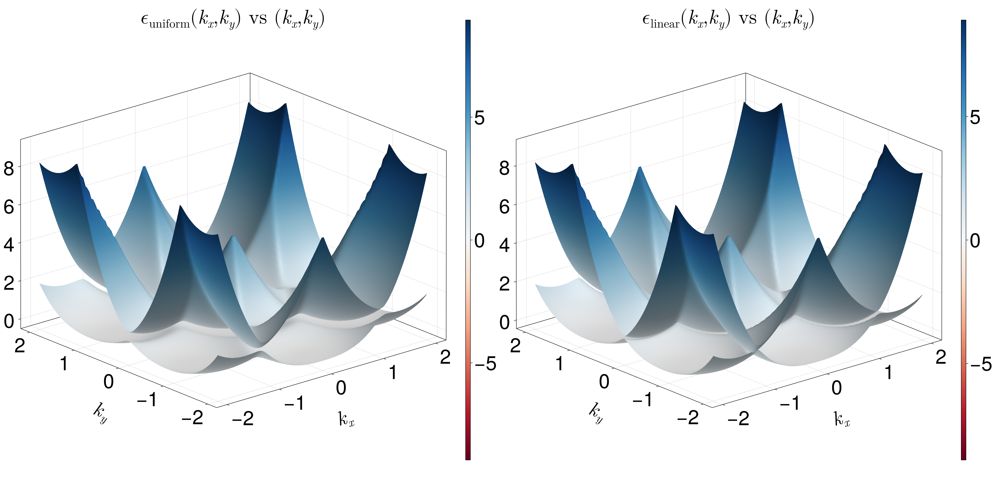

In [95]:
Nl = 3
nu = 0.5
kappa = 1
V = -0.7
shells = 1
mBZ_band_structure(Nl, nu, kappa, V, shells)

# Line cuts of band structure

In [4]:
function mBZ_band_structure_nu(q, Nl, kappa, V, shells)
    nu_list = range(0.1, 0.2, 10^2)
    mBZ_count = num_mBZ(shells)
    energies = Array{Float64}(undef, length(nu_list), mBZ_count)
    for i in 1:length(nu_list)
        nu = nu_list[i]
        ham = rmg_ham_mBZ_shells(q, Nl, nu, kappa, V, shells)
        energies[i, :] = real.(eigvals(Hermitian(ham)))
    end
    linear_energies = Array{Float64}(undef, length(nu_list), mBZ_count)
    for i in 1:length(nu_list)
        nu = nu_list[i]
        ham = rmg_ham_mBZ_shells_linear(q, Nl, nu, kappa, V, shells)
        linear_energies[i, :] = real.(eigvals(Hermitian(ham)))
    end
    fig = Figure(size=(3300, 1500), fontsize=50)
    ax = Axis(fig[1, 1]; xlabel=L"\nu", ylabel=L"\epsilon_\text{uniform}", title=L" \epsilon_\text{uniform} \text{ vs } \nu")

    index1 = 1
    index2 = 2
    
    lines!(ax, nu_list, energies[:, index1], label = L"1")
    lines!(ax, nu_list, energies[:, index2], label = L"2")


    ax1 = Axis(fig[1, 2]; xlabel=L"\nu", ylabel=L"\epsilon_\text{linear}", title=L" \epsilon_\text{linear} \text{ vs } \nu")
    
    lines!(ax1, nu_list, linear_energies[:, index1], label = L"1")
    lines!(ax1, nu_list, linear_energies[:, index2], label = L"2")

    fig[1, 3] = Legend(fig, ax1, patchsize = (50, 10), framevisible = true)

    fig
end

mBZ_band_structure_nu (generic function with 1 method)

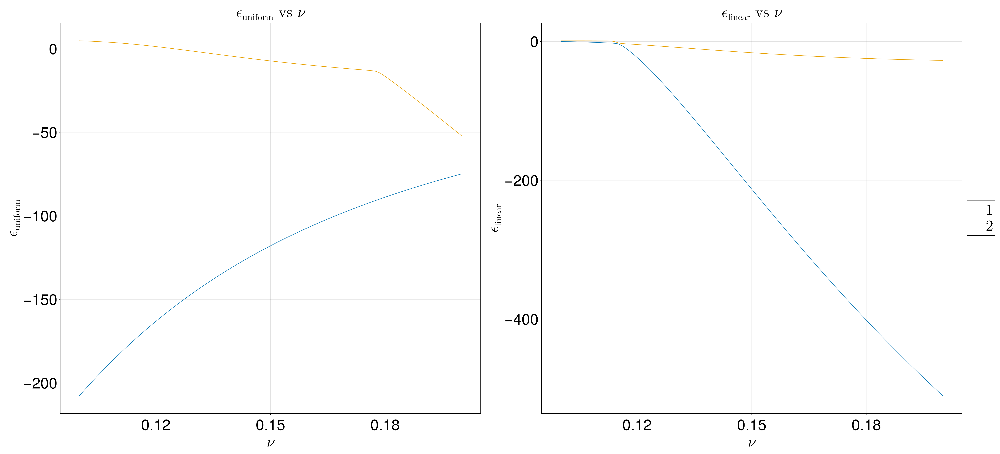

In [5]:
Nl = 3
kappa = 1
V = -10
shells = 11
q = kappa * [1, 0]
mBZ_band_structure_nu(q, Nl, kappa, V, shells)

# Uniform moire Berry curvature

In [6]:
function uniform_grid_bc(grid, Nl, nu, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), Nl)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)

    berry_list = Array{Float64}(undef, size(grid, 1))

    for i in 1:size(grid, 1)
        berry_list[i] = uniform_mBZ_bc!(g1, g2, gi, gj, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        grid[i, :], Nl, nu, kappa, V, shells, index, spacing)
    end
    return berry_list
end

uniform_grid_bc (generic function with 1 method)

In [15]:
function plot_uniform_bc(Nl, nu, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{uniform} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-2*kappa, 2*kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    bc_list = uniform_grid_bc(grid, Nl, nu, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

plot_uniform_bc (generic function with 1 method)

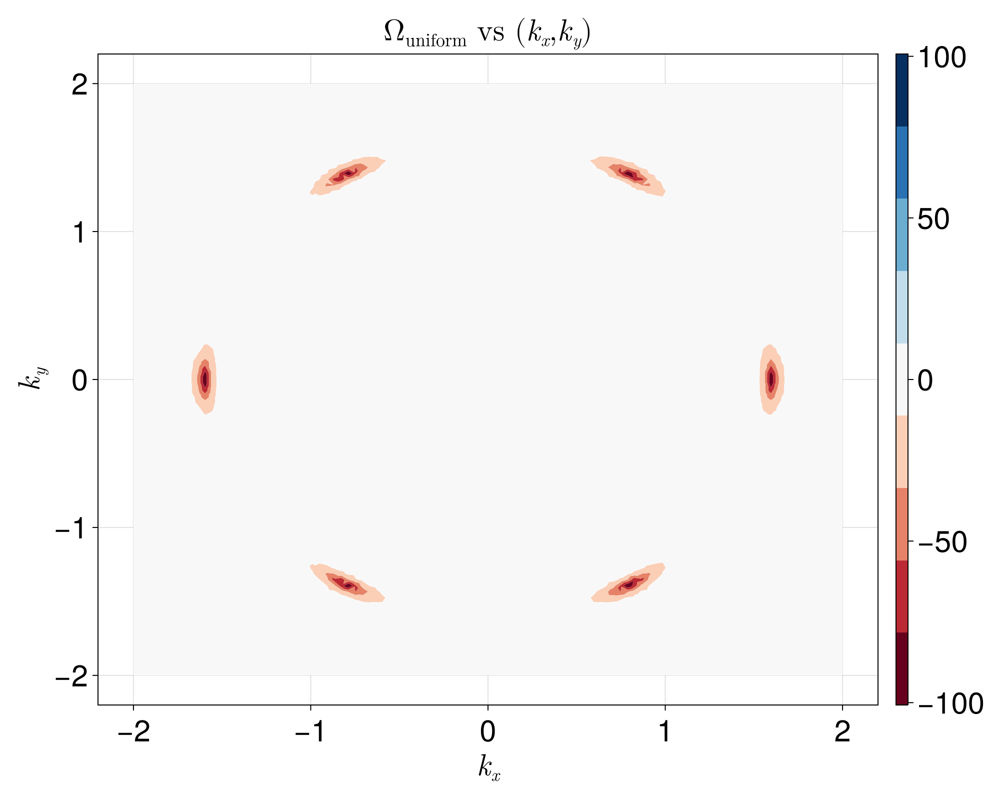

In [139]:
Nl = 3
nu = 0.6
kappa = 1
V = 100
shells = 1
index = 1
spacing = 10^(-2)
plot_uniform_bc(Nl, nu, kappa, V, shells, index, spacing)

In [42]:
function uniform_comp_nu(spacing, kappa, V, Nl, shells)
    origin = [0.0, 0.0]
    kappa_1 = kappa * [1.0, 0.0]
    q = [0.0, 0.0]
    nu_list = range(0.01, 1, 10^2)
    full_mBZ_list = Array{Float64}(undef, length(nu_list))
    patch_list = Array{Float64}(undef, length(nu_list))

    mBZ_grid = reshape(kappa_1 .+ q, (1, 2))
    patch_grid = reshape(origin .+ q, (1, 2))
    for j in 1:length(nu_list)
        nu = nu_list[j]
        full_mBZ_list[j] = uniform_grid_bc(mBZ_grid, Nl, nu, kappa, V, shells, 1, spacing)[1]
        
        delta = V/2 * rmg_delta_all(kappa, nu, Nl)
        alpha = V/2 * rmg_alpha_all(kappa, nu, Nl)
        vF = 3 * kappa^2
        patch_list[j] = rmg_patch_bc(patch_grid, spacing, Nl, nu, kappa, vF, delta, alpha)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\nu", ylabel = L"\Omega", title =  L"\Omega_\text{uniform} \text{ vs } \nu")
    lines!(ax1, nu_list, full_mBZ_list , label = "mBZ")
    lines!(ax1, nu_list, patch_list, label = "patch")

    ax2 = Axis(P[1, 3], xlabel = L"\nu", ylabel = L"\delta \Omega",  title =  L"\delta \Omega_\text{uniform} \text{ vs } \nu")
    lines!(ax2, nu_list, abs.((full_mBZ_list - patch_list)./full_mBZ_list))

    P[1, 2] = Legend(P, ax1, patchsize = (50, 10), framevisible = true)
    P
end

uniform_comp_nu (generic function with 1 method)

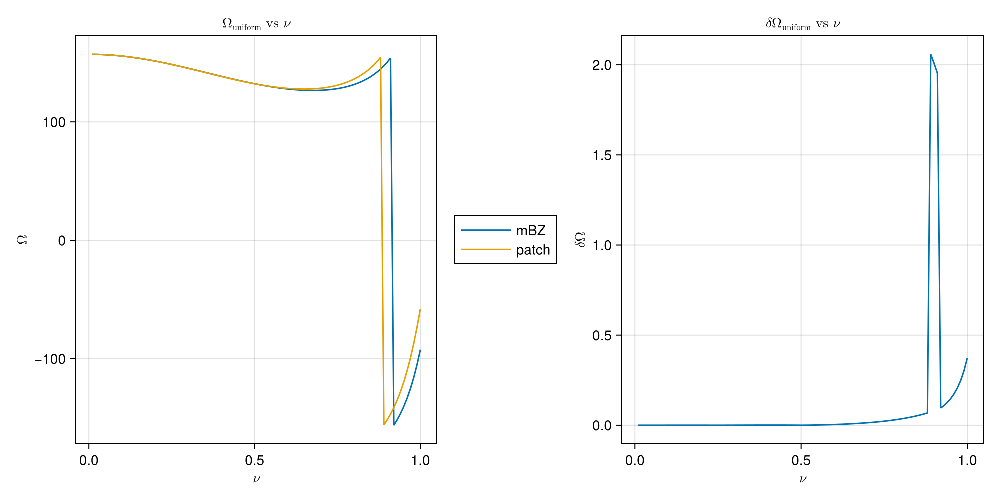

In [43]:
Nl = 3
kappa = 1
V = 0.1
shells = 3
spacing = 10^(-1)
uniform_comp_nu(spacing, kappa, V, Nl, shells)

In [52]:
function uniform_bc_comp(spacing, Nl, nu, kappa, V, shells)
    fig = Figure(size=(3800, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega^\text{3p}_\text{uniform} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax2 = Axis(fig[1, 3], title = L"\Omega^\text{mBZ}_\text{uniform} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax3 = Axis(fig[1, 5], title = L"\delta \Omega_\text{uniform} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    # grid = make_hex([0, 0], kappa, kappa / pd)

    kappa_1 = kappa * [1, 0]

    shift = 0.5 * range(-1, 1, 10^2)

    kx_list = kappa_1[1] * ones(10^2) .+ shift
    ky_list = kappa_1[2] * ones(10^2) .+ shift

    mBZ_grid = mesh_grid(kx_list, ky_list, Float64)

    patch_grid = mesh_grid(shift, shift, Float64)

    delta = V/2 * rmg_delta_all(kappa, nu, Nl)
    alpha = V/2 * rmg_alpha_all(kappa, nu, Nl)
    vF = 3 * kappa^2

    patch_bc = rmg_patch_bc(patch_grid, spacing, Nl, nu, kappa, vF, delta, alpha)

    mBZ_bc = uniform_grid_bc(mBZ_grid, Nl, nu, kappa, V, shells, 1, spacing)
    
    # patch
    zmax, zmin = maximum(patch_bc), minimum(patch_bc)
    zabs = maximum([abs(zmax), abs(zmin)])
    patch_levels = range(-zabs, zabs, 10)
    tr1 = tricontourf!(ax1, mBZ_grid[:, 1], mBZ_grid[:, 2], patch_bc, colormap = :RdBu, levels = patch_levels)
    cb1 = Colorbar(fig[1, 2], tr1)

   # mBZ
   zmax, zmin = maximum(mBZ_bc), minimum(mBZ_bc)
   zabs = maximum([abs(zmax), abs(zmin)])
   mBZ_levels = range(-zabs, zabs, 10)
   tr1 = tricontourf!(ax2, mBZ_grid[:, 1], mBZ_grid[:, 2], mBZ_bc, colormap = :RdBu, levels = mBZ_levels)
   cb1 = Colorbar(fig[1, 4], tr1)

   # error
   error = abs.((patch_bc .- mBZ_bc))
   tr1 = tricontourf!(ax3, mBZ_grid[:, 1], mBZ_grid[:, 2], error, colormap = :RdBu)
   cb1 = Colorbar(fig[1, 6], tr1)
   
   fig
end

uniform_bc_comp (generic function with 1 method)

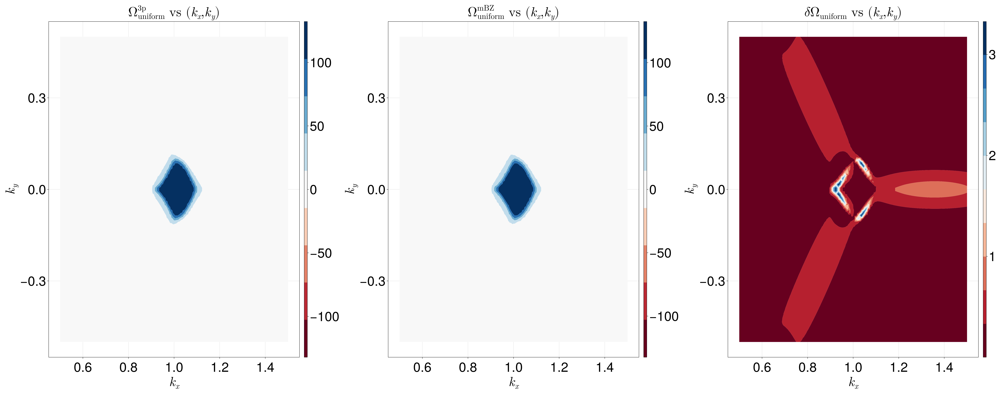

In [53]:
Nl = 3
nu = 0.5
kappa = 1
V = 0.1
shells = 1
spacing = 10^(-1)
uniform_bc_comp(spacing, Nl, nu, kappa, V, shells)

# Uniform Berry curvature convergence

In [287]:
function uniform_spacing_conv(k, Nl, nu, kappa, V, shells, index)
    exp_list = range(1, 4, 10^2)
    berry_list = Array{Float64}(undef, length(exp_list))
    point = reshape(k, (1, 2))
    for j in 1:length(exp_list)
        spacing = 10^(-exp_list[j])
        berry_list[j] = uniform_grid_bc(point, Nl, nu, kappa, V, shells, index, spacing)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"-\log(\text{spacing})", ylabel = L"\Omega(k_0)", 
    title =  L"\Omega_\text{uniform}(k_0) \text{ vs } -\log(\text{spacing})")
    lines!(ax1, exp_list, berry_list)
    P
end

uniform_spacing_conv (generic function with 1 method)

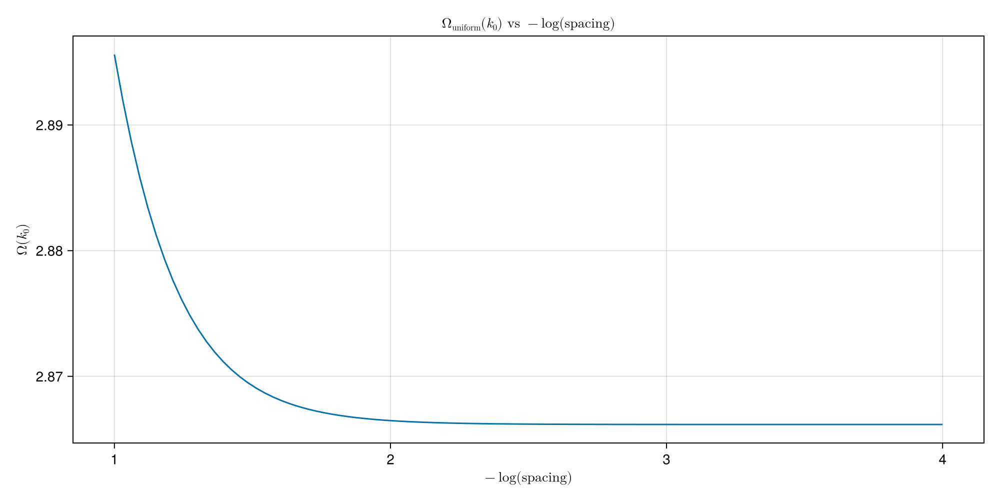

In [295]:
Nl = 3
nu = 0.6
kappa = 1
V = 10
shells = 1
index = 1
k = kappa * [1, 0]
uniform_spacing_conv(k, Nl, nu, kappa, V, shells, index)

In [307]:
function uniform_shell_conv(k, Nl, nu, kappa, V, index, spacing)
    shell_list = 10:20
    berry_list = Array{Float64}(undef, length(shell_list))
    point = reshape(k, (1, 2))
    for j in 1:length(shell_list)
        shells = shell_list[j]
        berry_list[j] = uniform_grid_bc(point, Nl, nu, kappa, V, shells, index, spacing)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\text{shells}", ylabel = L"\Omega(k_0)", title =  L"\Omega_\text{uniform}(k_0) \text{ vs } \text{shells}")
    lines!(ax1, shell_list, berry_list)
    P
end

uniform_shell_conv (generic function with 1 method)

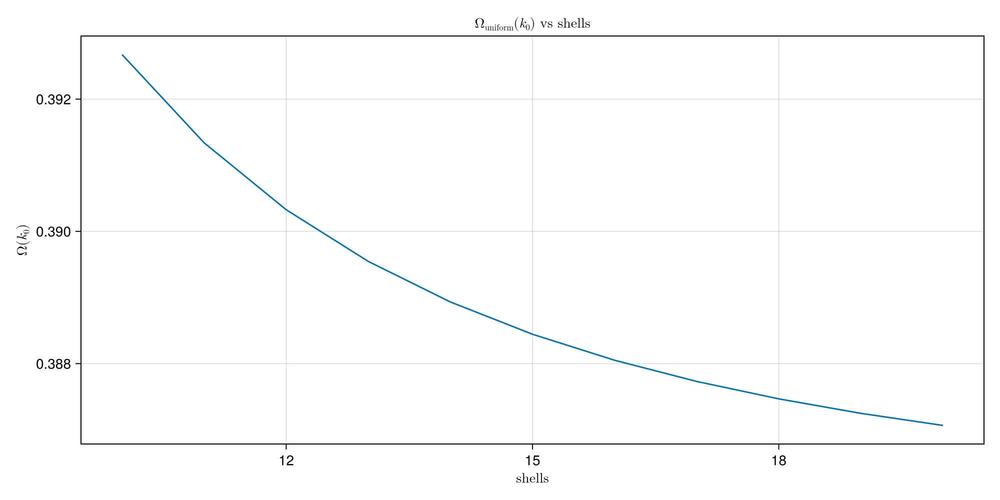

In [308]:
Nl = 3
nu = 0.6
kappa = 1
V = 10^1
index = 1
spacing = 10^(-2)
k = kappa * [0.3, 0.3]
uniform_shell_conv(k, Nl, nu, kappa, V, index, spacing)

# Uniform Chern number

In [314]:
# Compute Chern number over a single mBZ
function uniform_mBZ_chern(Nl, nu, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), Nl)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)
    
    #points = make_hex([0, 0], kappa, spacing)
    points = reshape([1, 0], (1, 2))

    berry = 0

    for i in 1:size(points, 1)
        berry += uniform_mBZ_bc!(g1, g2, gi, gj, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        points[i, :], Nl, nu, kappa, V, shells, index, spacing)
    end
    return 1/(2 * pi) * plaq_area * berry
end

uniform_mBZ_chern (generic function with 1 method)

In [316]:
Nl = 3
nu = 0.6
kappa = 1
V = 10^1
shells = 22
index = 1
spacing = 10^(-1)
uniform_mBZ_chern(Nl, nu, kappa, V, shells, index, spacing)

0.010000000000000002

I think that I could reasonable run $\text{spacing} = 0.1, \text{shells} = 22$ in around 1hour. Although the berry curvature does not converge for spacing = 0.1, it should (hopefully) be close enough for us to get a sense of the quantization.

# Uniform moire sampling diagnostic

In [261]:
function uniform_sample_diagnostic(Nl, nu, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{uniform} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-1*kappa, 1*kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    points = make_hex([0, 0], kappa, spacing)

    bc_list = uniform_grid_bc(grid, Nl, nu, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    scatter!(ax1, points[:, 1], points[:, 2], color = :green)

    fig
end

uniform_sample_diagnostic (generic function with 1 method)

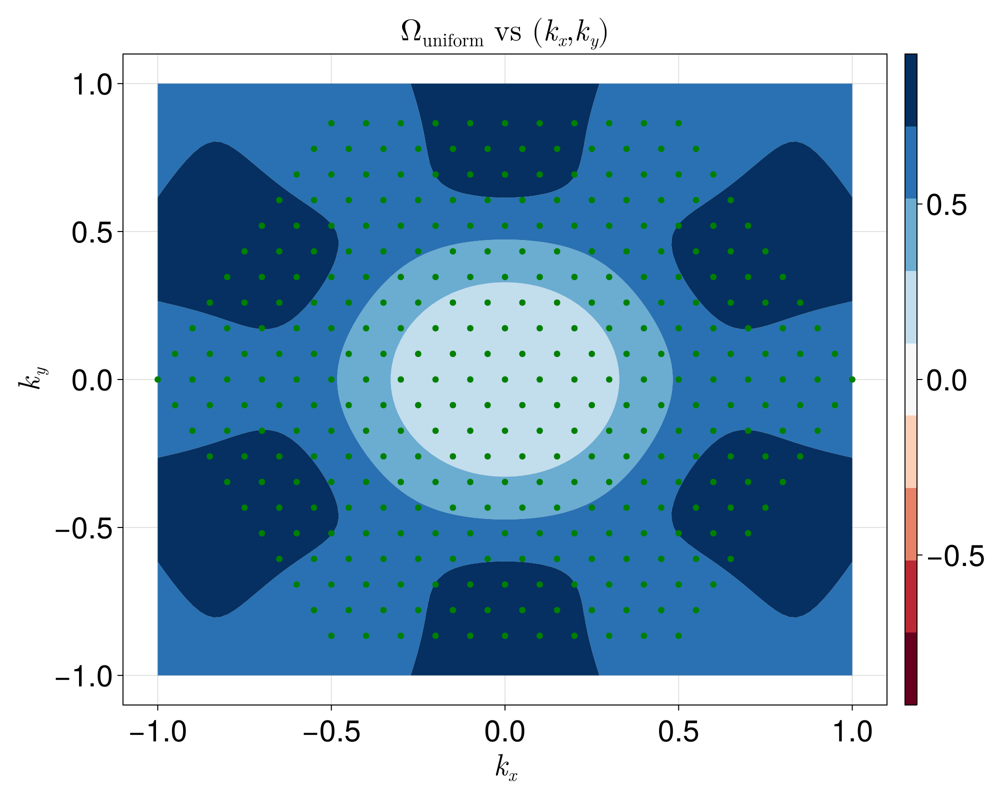

In [263]:
Nl = 3
nu = 0.6
kappa = 1
V = 10^1
shells = 3
index = 1
spacing = 10^(-1)
uniform_sample_diagnostic(Nl, nu, kappa, V, shells, index, spacing)

# Linear moire Berry curvature

In [319]:
function linear_grid_bc(grid, Nl, nu, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), Nl)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)

    berry_list = Array{Float64}(undef, size(grid, 1))

    for i in 1:size(grid, 1)
        berry_list[i] = linear_mBZ_bc!(g1, g2, gi, gj, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        grid[i, :], Nl, nu, kappa, V, shells, index, spacing)
    end
    return berry_list
end

linear_grid_bc (generic function with 1 method)

In [380]:
function plot_linear_bc(Nl, nu, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{linear} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-1*kappa, 1*kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    bc_list = linear_grid_bc(grid, Nl, nu, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

plot_linear_bc (generic function with 1 method)

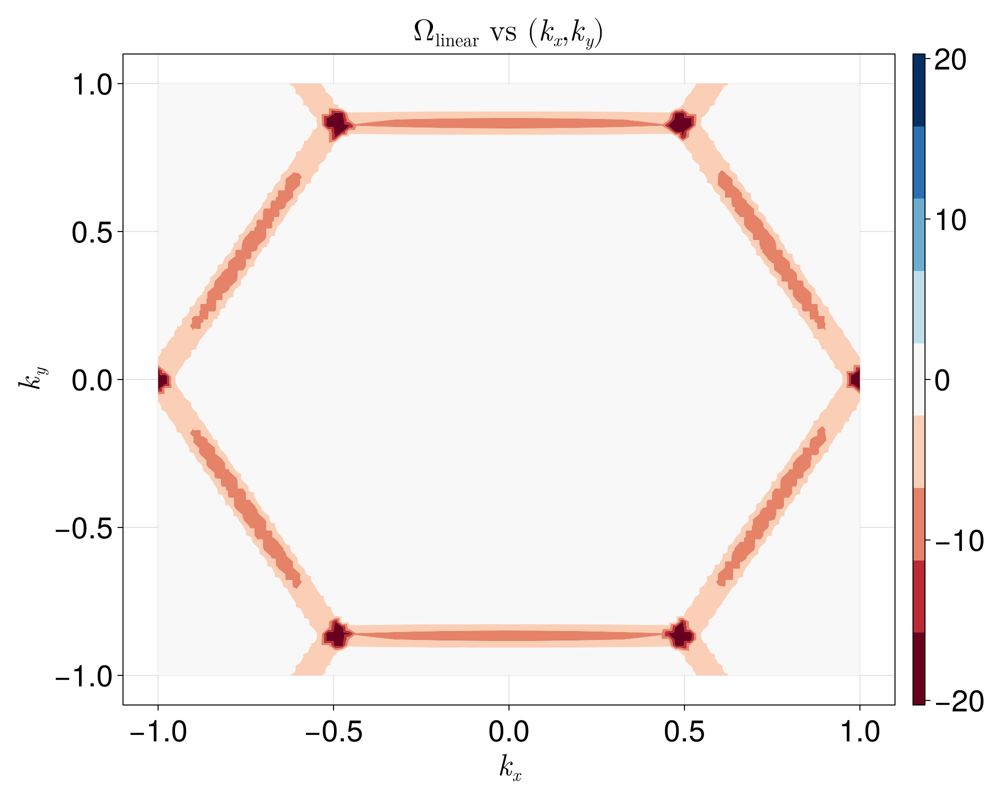

In [386]:
Nl = 3
nu = 0.2
kappa = 1
V = -0.01
shells = 2
index = 1
spacing = 10^(-1)
plot_linear_bc(Nl, nu, kappa, V, shells, index, spacing)

In [322]:
function linear_comp_nu(spacing, kappa, V, Nl, shells)
    origin = [0.0, 0.0]
    kappa_1 = kappa * [1.0, 0.0]
    q = [0.0, 0.0]
    nu_list = range(0.01, 1, 10^2)
    full_mBZ_list = Array{Float64}(undef, length(nu_list))
    patch_list = Array{Float64}(undef, length(nu_list))

    mBZ_grid = reshape(kappa_1 .+ q, (1, 2))
    patch_grid = reshape(origin .+ q, (1, 2))
    for j in 1:length(nu_list)
        nu = nu_list[j]
        full_mBZ_list[j] = linear_grid_bc(mBZ_grid, Nl, nu, kappa, V, shells, 1, spacing)[1]
        
        delta = V/2 * rmg_delta_linear(kappa, nu, Nl)
        alpha = V/2 * rmg_alpha_linear(kappa, nu, Nl)
        vF = 3 * kappa^2
        patch_list[j] = rmg_patch_bc(patch_grid, spacing, Nl, nu, kappa, vF, delta, alpha)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\nu", ylabel = L"\Omega", title =  L"\Omega_\text{linear} \text{ vs } \nu")
    lines!(ax1, nu_list, full_mBZ_list , label = "mBZ")
    lines!(ax1, nu_list, patch_list, label = "patch")

    ax2 = Axis(P[1, 3], xlabel = L"\nu", ylabel = L"\delta \Omega",  title =  L"\delta \Omega_\text{linear} \text{ vs } \nu")
    lines!(ax2, nu_list, abs.((full_mBZ_list - patch_list)./full_mBZ_list))

    P[1, 2] = Legend(P, ax1, patchsize = (50, 10), framevisible = true)
    P
end

linear_comp_nu (generic function with 1 method)

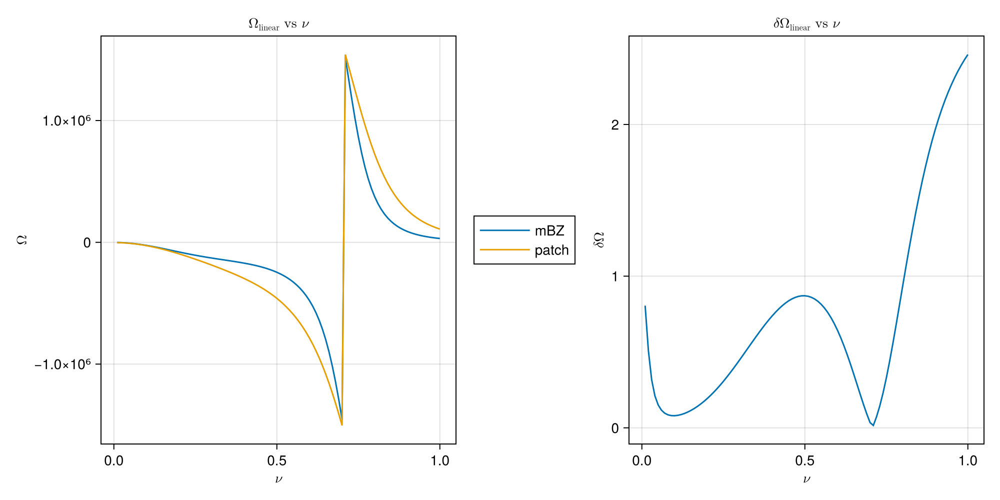

In [355]:
Nl = 3
kappa = 1
V = -0.01
shells = 1
spacing = 10^(-3)
linear_comp_nu(spacing, kappa, V, Nl, shells)

In [330]:
function linear_bc_comp(spacing, Nl, nu, kappa, V, shells)
    fig = Figure(size=(3800, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega^\text{3p}_\text{linear} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax2 = Axis(fig[1, 3], title = L"\Omega^\text{mBZ}_\text{linear} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax3 = Axis(fig[1, 5], title = L"\delta \Omega_\text{linear} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    # grid = make_hex([0, 0], kappa, kappa / pd)

    kappa_1 = kappa * [1, 0]

    shift = 0.5 * range(-1, 1, 10^2)

    kx_list = kappa_1[1] * ones(10^2) .+ shift
    ky_list = kappa_1[2] * ones(10^2) .+ shift

    mBZ_grid = mesh_grid(kx_list, ky_list, Float64)

    patch_grid = mesh_grid(shift, shift, Float64)

    delta = V/2 * rmg_delta_linear(kappa, nu, Nl)
    alpha = V/2 * rmg_alpha_linear(kappa, nu, Nl)
    vF = 3 * kappa^2

    patch_bc = rmg_patch_bc(patch_grid, spacing, Nl, nu, kappa, vF, delta, alpha)

    mBZ_bc = linear_grid_bc(mBZ_grid, Nl, nu, kappa, V, shells, 1, spacing)
    
    # patch
    zmax, zmin = maximum(patch_bc), minimum(patch_bc)
    zabs = maximum([abs(zmax), abs(zmin)])
    patch_levels = range(-zabs, zabs, 10)
    tr1 = tricontourf!(ax1, mBZ_grid[:, 1], mBZ_grid[:, 2], patch_bc, colormap = :RdBu, levels = patch_levels)
    cb1 = Colorbar(fig[1, 2], tr1)

   # mBZ
   zmax, zmin = maximum(mBZ_bc), minimum(mBZ_bc)
   zabs = maximum([abs(zmax), abs(zmin)])
   mBZ_levels = range(-zabs, zabs, 10)
   tr1 = tricontourf!(ax2, mBZ_grid[:, 1], mBZ_grid[:, 2], mBZ_bc, colormap = :RdBu, levels = mBZ_levels)
   cb1 = Colorbar(fig[1, 4], tr1)

   # error
   error = abs.((patch_bc .- mBZ_bc))
   tr1 = tricontourf!(ax3, mBZ_grid[:, 1], mBZ_grid[:, 2], error, colormap = :RdBu)
   cb1 = Colorbar(fig[1, 6], tr1)
   
   fig
end

linear_bc_comp (generic function with 1 method)

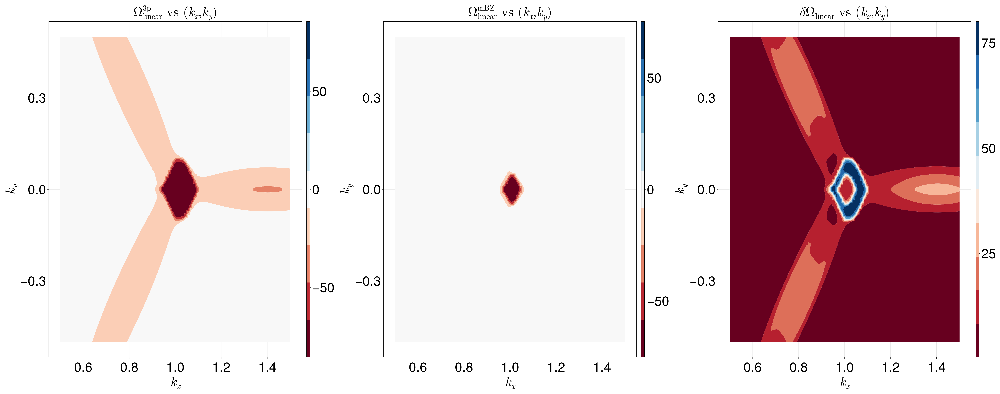

In [332]:
Nl = 3
nu = 0.5
kappa = 1
V = -0.1
shells = 1
spacing = 10^(-1)
linear_bc_comp(spacing, Nl, nu, kappa, V, shells)

# Linear Berry curvature convergence

In [333]:
function linear_spacing_conv(k, Nl, nu, kappa, V, shells, index)
    exp_list = range(1, 4, 10^2)
    berry_list = Array{Float64}(undef, length(exp_list))
    point = reshape(k, (1, 2))
    for j in 1:length(exp_list)
        spacing = 10^(-exp_list[j])
        berry_list[j] = linear_grid_bc(point, Nl, nu, kappa, V, shells, index, spacing)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"-\log(\text{spacing})", ylabel = L"\Omega(k_0)", 
    title =  L"\Omega_\text{linear}(k_0) \text{ vs } -\log(\text{spacing})")
    lines!(ax1, exp_list, berry_list)
    P
end

linear_spacing_conv (generic function with 1 method)

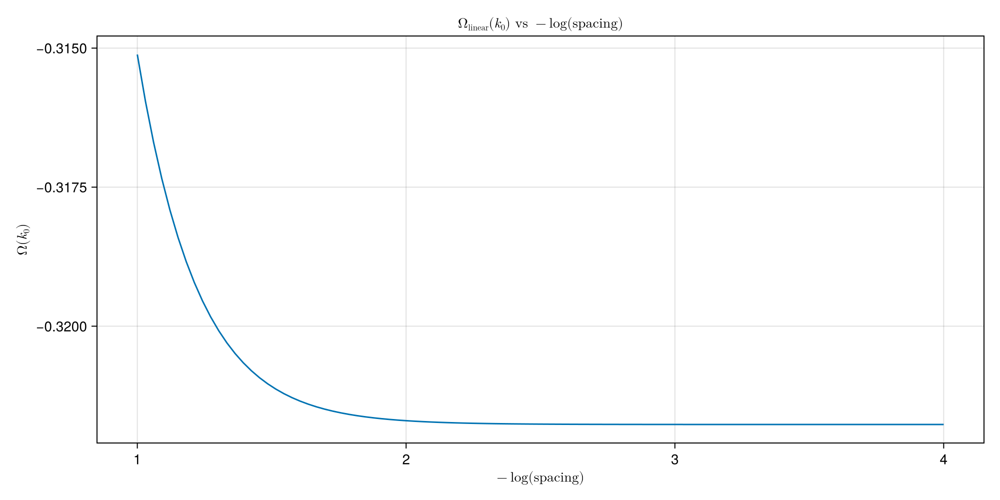

In [334]:
Nl = 3
nu = 0.6
kappa = 1
V = 10
shells = 1
index = 1
k = kappa * [1, 0]
linear_spacing_conv(k, Nl, nu, kappa, V, shells, index)

In [338]:
function linear_shell_conv(k, Nl, nu, kappa, V, index, spacing)
    shell_list = 25:30
    berry_list = Array{Float64}(undef, length(shell_list))
    point = reshape(k, (1, 2))
    for j in 1:length(shell_list)
        shells = shell_list[j]
        berry_list[j] = linear_grid_bc(point, Nl, nu, kappa, V, shells, index, spacing)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\text{shells}", ylabel = L"\Omega(k_0)", title =  L"\Omega_\text{linear}(k_0) \text{ vs } \text{shells}")
    lines!(ax1, shell_list, berry_list)
    P
end

linear_shell_conv (generic function with 1 method)

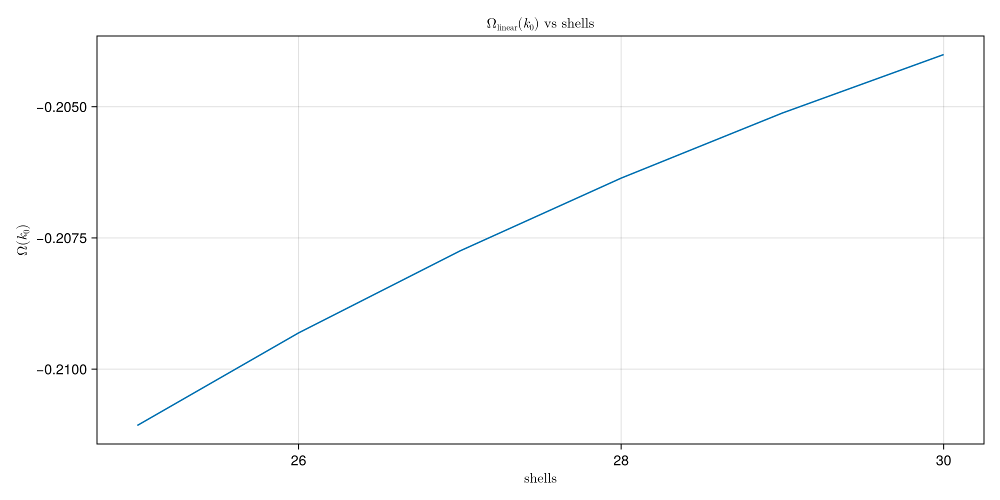

In [339]:
Nl = 3
nu = 0.6
kappa = 1
V = 10^1
index = 1
spacing = 10^(-2)
k = kappa * [0.3, 0.3]
linear_shell_conv(k, Nl, nu, kappa, V, index, spacing)

# Linear Chern number

In [348]:
# Compute Chern number over a single mBZ
function linear_mBZ_chern(Nl, nu, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), Nl)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)
    
    points = make_hex([0, 0], kappa, spacing)

    berry = 0

    for i in 1:size(points, 1)
        berry += linear_mBZ_bc!(g1, g2, gi, gj, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        points[i, :], Nl, nu, kappa, V, shells, index, spacing)
    end
    return 1/(2 * pi) * plaq_area * berry
end

linear_mBZ_chern (generic function with 1 method)

In [388]:
Nl = 3
nu = 0.2
kappa = 1
V = -0.001
shells = 1
index = 1
spacing = 10^(-2)
linear_mBZ_chern(Nl, nu, kappa, V, shells, index, spacing)

-0.13136109950420705

# Linear moire sampling diagnostic

In [362]:
function linear_sample_diagnostic(Nl, nu, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{linear} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-1*kappa, 1*kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    points = make_hex([0, 0], kappa, spacing)

    bc_list = linear_grid_bc(grid, Nl, nu, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    scatter!(ax1, points[:, 1], points[:, 2], color = :green)

    fig
end

linear_sample_diagnostic (generic function with 1 method)

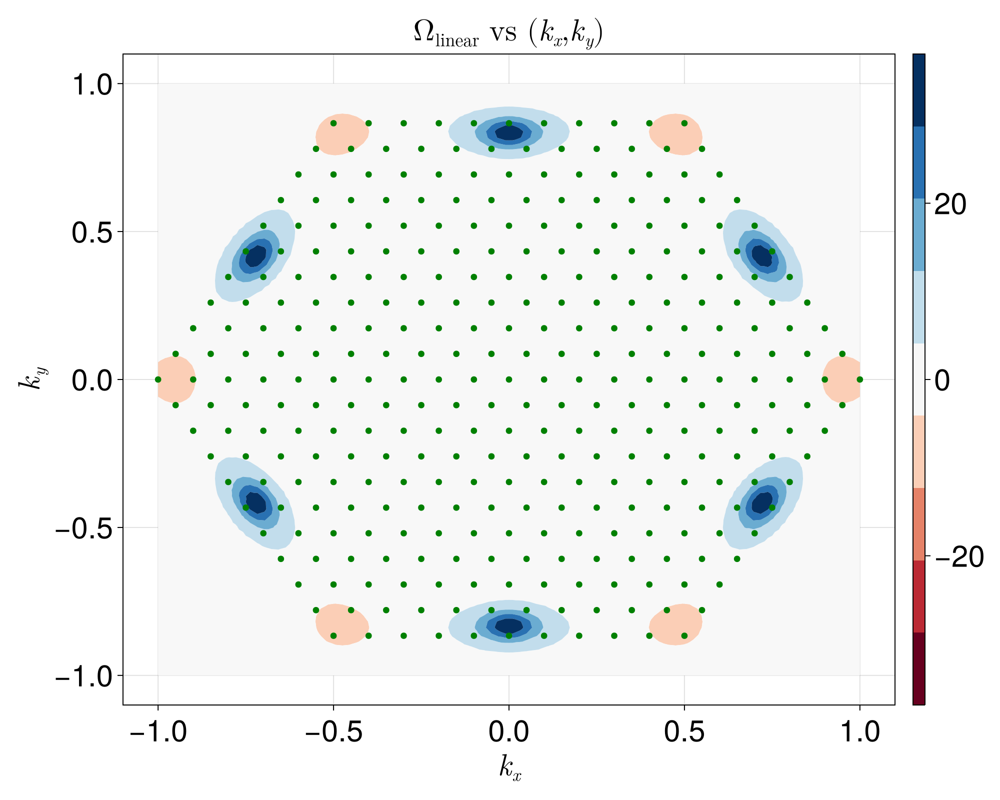

In [363]:
Nl = 3
nu = 0.6
kappa = 1
V = 10^1
shells = 3
index = 1
spacing = 10^(-1)
linear_sample_diagnostic(Nl, nu, kappa, V, shells, index, spacing)